<h1 style="color:blue;">Scenario 7 - DATA 6310</h1> 

- C2.S7.Py01	Import Data and Filter Based on Brand 
- C2.S7.Py02	Clean the data and columns
- C2.S7.Py03	Transform data using sklearn
- C2.S7.Py04    Creating a Correlation Matrix for a Recommender
- C2.S7.Py05    Analyze other Products and Brands for Recommendations  

In [8]:
#Code Block 1
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns



# New trick to widen the screen
from IPython.core.display import display, HTML

#Widens the code landscape 
display(HTML("<style>.container { width:95% !important; }</style>"))

pd.set_option('display.max_columns',500) #allows for up to 500 columns to be displayed when viewing a dataframe

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

pd.options.mode.chained_assignment = None



%matplotlib inline

import sklearn
from sklearn.decomposition import TruncatedSVD

<h2 style="color:blue;">  Import Data and Filter Based on Brand  </h2> 

In [10]:
#Code Block 2

url = 'Scenario7_Data/ap_all.csv'
url2 = 'Scenario7_Data/ap_labels.csv'
url3 = 'Scenario7_Data/ap_demo.csv'

df_ap_all = pd.read_csv(url, index_col=0, header=0)
df_ap_labels = pd.read_csv(url2, header=0)
df_ap_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96501 entries, 0 to 96500
Columns: 4320 entries, APID to MP000148_Rank_Base_10_DISH0148
dtypes: float64(4085), int64(227), object(8)
memory usage: 3.1+ GB


In [12]:
df_ap_demo = pd.read_csv(url3, index_col=0, header=0)
df_ap_demo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 0 to 84081
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   APID                            84082 non-null  object
 1   Income_Dollars                  84082 non-null  int64 
 2   Age                             84082 non-null  int64 
 3   Adults_in_Household             84082 non-null  int64 
 4   Househoold_Size                 84082 non-null  int64 
 5   Discretionary_Spending_Dollars  84082 non-null  int64 
 6   Homeowner                       84082 non-null  int64 
 7   Married                         84082 non-null  int64 
 8   Predict_4                       84082 non-null  int64 
 9   Age_Cat                         84082 non-null  object
 10  Income_Cat                      84082 non-null  object
 11  Household_Cat                   84082 non-null  object
dtypes: int64(8), object(4)
memory usage: 8.3+ MB


In [15]:
df_ap_all.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96501 entries, 0 to 96500
Columns: 4320 entries, APID to MP000148_Rank_Base_10_DISH0148
dtypes: float64(4085), int64(227), object(8)
memory usage: 3.1+ GB


In [17]:
#Code Block 3

df_ap_labels.head()

,APID,Type
0,AP000027_Affinity_for_a_New_Suzuki_rank_base_1...,vehicle
1,AP000085_AAA_Auto_Club_V2_rank_base_20_AP000085,vehicle
2,AP000250_Any_Auto_Club_V2_rank_base_20_AFLGC335,vehicle
3,AP000251_AARP_Roadside_Assistance_Auto_Club_ra...,vehicle
4,AP000252_Allstate_Motor_Club_rank_base_10_aflg...,vehicle


In [19]:
#Code Block 4

df_ap_labels['Type'].value_counts()

Type
store                868
finance              801
demo                 661
brand                244
media                218
none                 167
footwear             116
tech                 102
brand apparel         98
TV Channels           89
health                89
TV Tech               86
Mobile                80
brand footwear        75
food                  69
read                  66
Radio                 59
vacation              52
Vehicle Purchase      50
vehicle               50
leisure               41
Email                 40
Vehicle Brand         37
brand appliance       32
pets                  27
Gaming                27
plans                 26
TV Shows              16
Drinks                12
membership            10
Vehicle in Market      6
TV Sports              5
Name: count, dtype: int64

### XXXXXXXXX Start over point XXXXXXXXX

- When you want to rerun all of your code, you do not need to go all the way to the top since we do not use df_ap_all.  
- df_ap_all takes a long time to run so by starting here, we save alot of time when we need a refresh.

In [21]:
#Code Block 5

ap_brand = df_ap_labels[df_ap_labels['Type']=='brand']
ap_brand_list = ap_brand['APID'].tolist()
ap_brand_list

['AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556',
 'AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557',
 'AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558',
 'AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559',
 'AP005560_Purchase_Lays_Brand_Snacks_rank_base_20_AP005560',
 'AP005561_Purchase_Orville_Redenbachers_Brand_Snacks_rank_base_20_AP005561',
 'AP005562_Purchase_Pop_secret_Brand_Snacks_rank_base_20_AP005562',
 'AP005563_Purchase_Pringles_Brand_Snacks_rank_base_20_AP005563',
 'AP005564_Purchase_Rold_Gold_Brand_Snacks_rank_base_20_AP005564',
 'AP005565_Purchase_Ruffles_Brand_Snacks_rank_base_20_AP005565',
 'AP005566_Purchase_Stacys_Brand_Snacks_rank_base_20_AP005566',
 'AP005567_Purchase_Tostitos_Brand_Snacks_rank_base_20_AP005567',
 'AP005568_Purchase_Cheese_Nips_Brand_Crackers_rank_base_20_AP005568',
 'AP005569_Purchase_Honeymaid_Brand_Crackers_rank_base_20_AP005569',
 'AP005570_Purchase_Kashi_Brand_Crackers_rank_base_20_AP005570

In [23]:
#Code Block 6

df_ap_brand = df_ap_all[ap_brand_list]
df_ap_brand = pd.concat([df_ap_all['APID'], df_ap_brand], axis=1)
df_ap_brand.info(max_cols = 245)

<class 'pandas.core.frame.DataFrame'>
Index: 96501 entries, 0 to 96500
Data columns (total 245 columns):
 #    Column                                                                                           Non-Null Count  Dtype  
---   ------                                                                                           --------------  -----  
 0    APID                                                                                             96501 non-null  object 
 1    AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556                                     84082 non-null  float64
 2    AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557                                     84082 non-null  float64
 3    AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558                                      84082 non-null  float64
 4    AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559                                  84082 non-null  float64
 5    

In [25]:
#Code Block 7

df_ap_brand = df_ap_brand.dropna(axis=0)
df_ap_brand.info()

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Columns: 245 entries, APID to AP002082_St_Ives_Apricot_Scrub_rank_base_20_rflg1320
dtypes: float64(244), object(1)
memory usage: 157.8+ MB


In [27]:
#Code Block 8

df_ap_brand_demo = pd.merge(df_ap_brand, df_ap_demo, on="APID", how='inner')
df_ap_brand_demo.head()

,APID,AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556,AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557,AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558,AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559,AP005560_Purchase_Lays_Brand_Snacks_rank_base_20_AP005560,AP005561_Purchase_Orville_Redenbachers_Brand_Snacks_rank_base_20_AP005561,AP005562_Purchase_Pop_secret_Brand_Snacks_rank_base_20_AP005562,AP005563_Purchase_Pringles_Brand_Snacks_rank_base_20_AP005563,AP005564_Purchase_Rold_Gold_Brand_Snacks_rank_base_20_AP005564,AP005565_Purchase_Ruffles_Brand_Snacks_rank_base_20_AP005565,AP005566_Purchase_Stacys_Brand_Snacks_rank_base_20_AP005566,AP005567_Purchase_Tostitos_Brand_Snacks_rank_base_20_AP005567,AP005568_Purchase_Cheese_Nips_Brand_Crackers_rank_base_20_AP005568,AP005569_Purchase_Honeymaid_Brand_Crackers_rank_base_20_AP005569,AP005570_Purchase_Kashi_Brand_Crackers_rank_base_20_AP005570,AP005571_Purchase_Keebler_Brand_Crackers_rank_base_20_AP005571,AP005572_Purchase_Lunchables_Brand_Crackers_rank_base_20_AP005572,AP005573_Purchase_Nabisco_Brand_Crackers_rank_base_20_AP005573,AP005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers_rank_base_20_AP005574,AP005575_Purchase_Ritz_Brand_Crackers_rank_base_20_AP005575,AP005576_Purchase_Rykrisp_Brand_Crackers_rank_base_20_AP005576,AP005577_Purchase_Sabra_Brand_Crackers_rank_base_20_AP005577,AP005578_Purchase_Sunshine_Brand_Crackers_rank_base_20_AP005578,AP005579_Purchase_Teddy_Grahams_Brand_Crackers_rank_base_20_AP005579,AP005580_Purchase_Triscuit_Brand_Crackers_rank_base_20_AP005580,AP005581_Purchase_Wheat_Thins_Brand_Crackers_rank_base_20_AP005581,AP005582_Purchase_AW_Brand_Carbonated_Beverage_rank_base_20_AP005582,AP005583_Purchase_Crush_Brand_Carbonated_Beverage_rank_base_20_AP005583,AP005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage_rank_base_20_AP005584,AP005585_Purchase_Fanta_Brand_Carbonated_Beverage_rank_base_20_AP005585,AP005586_Purchase_Fresca_Brand_Carbonated_Beverage_rank_base_20_AP005586,AP005587_Purchase_Goose_Island_Brand_Carbonated_Beverage_rank_base_20_AP005587,AP005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage_rank_base_20_AP005588,AP005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage_rank_base_20_AP005589,AP005590_Purchase_Pepsi_Brand_Carbonated_Beverage_rank_base_20_AP005590,AP005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage_rank_base_20_AP005591,AP005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage_rank_base_20_AP005592,AP005593_Purchase_Schweppes_Brand_Carbonated_Beverage_rank_base_20_AP005593,AP005594_Purchase_Seven_UP_Brand_Carbonated_Beverage_rank_base_20_AP005594,AP005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage_rank_base_20_AP005595,AP005596_Purchase_Sprite_Brand_Carbonated_Beverage_rank_base_20_AP005596,AP005597_Purchase_Arizona_Non_Carbonated_Beverage_rank_base_20_AP005597,AP005598_Purchase_Brisk_Non_Carbonated_Beverage_rank_base_20_AP005598,AP005599_Purchase_Campbells_Non_Carbonated_Beverage_rank_base_20_AP005599,AP005600_Purchase_Capri_Sun_Non_Carbonated_Beverage_rank_base_20_AP005600,AP005601_Purchase_Country_Time_Non_Carbonated_Beverage_rank_base_20_AP005601,AP005602_Purchase_Crystal_Light_Non_Carbonated_Beverage_rank_base_20_AP005602,AP005603_Purchase_Dasani_Non_Carbonated_Beverage_rank_base_20_AP005603,AP005604_Purchase_Dole_Non_Carbonated_Beverage_rank_base_20_AP005604,AP005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage_rank_base_20_AP005605,AP005606_Purchase_Fuze_Non_Carbonated_Beverage_rank_base_20_AP005606,AP005607_Purchase_Gatorade_Non_Carbonated_Beverage_rank_base_20_AP005607,AP005608_Purchase_Gatorade_AM_Non_Carbonated_Beverage_rank_base_20_AP005608,AP005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage_rank_base_20_AP005609,AP005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage_rank_base_20_AP005610,AP005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage_rank_base_20_AP005611,AP005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage_rank_base_

In [29]:
#Code Block 9 

df_ap_brand_demo.info(max_cols = 270)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84082 entries, 0 to 84081
Data columns (total 256 columns):
 #    Column                                                                                           Non-Null Count  Dtype  
---   ------                                                                                           --------------  -----  
 0    APID                                                                                             84082 non-null  object 
 1    AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556                                     84082 non-null  float64
 2    AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557                                     84082 non-null  float64
 3    AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558                                      84082 non-null  float64
 4    AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559                                  84082 non-null  float64
 

<h2 style="color:blue;">  Clean data and columns for Brand  </h2> 

#### Set all rank bases to 20
- Transform data using MinMax Scaler and name it **df_ap_brand_mm**
- Convert dataframe to the correct scale, for example:
    - Multiply by 20 if you want all scales to be rank base 20
    - Multiply by 100 if you want all scales to be rank base 100
    
    
- for **df_ap_brand_mm_convert**, we will make all scales rank base 20

In [32]:
#Code Block 10

df_ap_brand.info(max_cols=245)

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Data columns (total 245 columns):
 #    Column                                                                                           Non-Null Count  Dtype  
---   ------                                                                                           --------------  -----  
 0    APID                                                                                             84082 non-null  object 
 1    AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556                                     84082 non-null  float64
 2    AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557                                     84082 non-null  float64
 3    AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558                                      84082 non-null  float64
 4    AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559                                  84082 non-null  float64
 5    

### Which columns are not rank base 20

In [41]:
#Code Block 11

pd.set_option('display.max_colwidth', 1)
ap_brand[~ap_brand['APID'].str.contains("rank_base_20_")]

,APID,Type
2879,AP002009_Advil_Cold_and_Sinus_rank_base_5_rflg1238,brand
2881,AP002028_Tylenol_Cold_rank_base_10_rflg1264,brand
2883,AP002037_Other_Cold_Sinus_and_Allergy_Remedies_rank_base_5_RFLG1274,brand
2884,AP002038_Caplets_rank_base_5_rflg1275,brand
2885,AP002039_Effervescent_rank_base_10_rflg1276,brand
2887,AP002041_Liquigels_Liquicaps_rank_base_10_rflg1278,brand
2889,AP002043_Nasal_Strips_rank_base_100_RFLG1280,brand
2890,AP002044_Almay_Complexion_Care_rank_base_100_rflg1282,brand
2892,AP002046_Avon_Clearskin_Complexion_Care_rank_base_100_RFLG1284,brand
2895,AP002051_Clean_and_Clear_Advantage_rank_base_100_rflg1289,brand


### Which columns have a rank base of 10

#### Notice that we included the underscore after the 10

In [46]:
#Code Block 12

ap_brand[ap_brand['APID'].str.contains("rank_base_10_")]

,APID,Type
2881,AP002028_Tylenol_Cold_rank_base_10_rflg1264,brand
2885,AP002039_Effervescent_rank_base_10_rflg1276,brand
2887,AP002041_Liquigels_Liquicaps_rank_base_10_rflg1278,brand


### Which columns have a rank base of 100

In [54]:
#Code Block 13

ap_brand[ap_brand['APID'].str.contains("rank_base_100")]

,APID,Type
2889,AP002043_Nasal_Strips_rank_base_100_RFLG1280,brand
2890,AP002044_Almay_Complexion_Care_rank_base_100_rflg1282,brand
2892,AP002046_Avon_Clearskin_Complexion_Care_rank_base_100_RFLG1284,brand
2895,AP002051_Clean_and_Clear_Advantage_rank_base_100_rflg1289,brand
2903,AP002071_Nivea_for_Men_Complexion_Care_rank_base_100_rflg1309,brand
2904,AP002072_Noxzema_Plus_Skin_Cream_rank_base_100_rflg1310,brand


In [56]:
#Code Block 14

ap_brand[ap_brand['APID'].str.contains("rank_base_20")].count()

APID    232
Type    232
dtype: int64

### Create new column to denote rank base

In [59]:
#Code Block 15

ap_brand.loc[ap_brand['APID'].str.contains('rank_base_20'), 'Rank_Base'] = 20
ap_brand.loc[ap_brand['APID'].str.contains('rank_base_10_'), 'Rank_Base'] = 10
ap_brand.loc[ap_brand['APID'].str.contains('rank_base_100'), 'Rank_Base'] = 100
ap_brand.loc[ap_brand['APID'].str.contains('rank_base_5'), 'Rank_Base'] = 5
ap_brand

,APID,Type,Rank_Base
833,AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556,brand,20.0
834,AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557,brand,20.0
835,AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558,brand,20.0
836,AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559,brand,20.0
837,AP005560_Purchase_Lays_Brand_Snacks_rank_base_20_AP005560,brand,20.0
...,...,...,...
2905,AP002074_Olay_Daily_Facials_rank_base_20_RFLG1312,brand,20.0
2906,AP002076_Olay_Regenerist_Complexion_Care_rank_base_20_RFLG1314,brand,20.0
2907,AP002079_Ponds_Cold_Cream_rank_base_20_RFLG1317,brand,20.0
2908,AP002081_Sea_Breeze_Astringent_rank_base_20_RFLG1319,brand,20.0


### Let's clean up the column names now that we do not need to know which one is which rank base.

### Change headings for df_ap_brand

In [61]:
#Code Block 16

#Set each column to all lowercase
df_ap_brand.columns = df_ap_brand.columns.str.lower()

#Remove numbers
df_ap_brand.columns=df_ap_brand.columns.str.replace('\d+','').str.strip()

#remove ap_purchase
df_ap_brand.columns=df_ap_brand.columns.str.replace('ap_purchase_','').str.strip()

#remove ap_
df_ap_brand.columns=df_ap_brand.columns.str.replace('ap_','').str.strip()

#remove rank_base__ap. 
#NOTE: notice the between base and app is 2 underscores __ that is because we already removed all of the numbers
df_ap_brand.columns=df_ap_brand.columns.str.replace('_rank_base__ap','').str.strip()

#remove rank_base (some columns did not have _ap at the end)
df_ap_brand.columns=df_ap_brand.columns.str.replace('_rank_base_','').str.strip()

#remove _rflg
df_ap_brand.columns=df_ap_brand.columns.str.replace('_rflg','').str.strip()

df_ap_brand.info(max_cols = 245)

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Data columns (total 245 columns):
 #    Column                                                                                Non-Null Count  Dtype  
---   ------                                                                                --------------  -----  
 0    apid                                                                                  84082 non-null  object 
 1    ap005556_purchase_cheetos_brand_snacks20_ap005556                                     84082 non-null  float64
 2    ap005557_purchase_doritos_brand_snacks20_ap005557                                     84082 non-null  float64
 3    ap005558_purchase_fritos_brand_snacks20_ap005558                                      84082 non-null  float64
 4    ap005559_purchase_jolly_time_brand_snacks20_ap005559                                  84082 non-null  float64
 5    ap005560_purchase_lays_brand_snacks20_ap005560                               

<>:7: SyntaxWarning: invalid escape sequence '\d'
<>:7: SyntaxWarning: invalid escape sequence '\d'
/var/folders/ww/gvxz55x16sj2qt6_7hv99n0w0000gn/T/ipykernel_11032/2583383115.py:7: SyntaxWarning: invalid escape sequence '\d'
  df_ap_brand.columns=df_ap_brand.columns.str.replace('\d+','').str.strip()


### Change each column heading to a title version (capitalize the first letter of each word)

In [63]:
#Code Block 17

df_ap_brand.columns = df_ap_brand.columns.str.title()
df_ap_brand.info(max_cols = 245)

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Data columns (total 245 columns):
 #    Column                                                                                Non-Null Count  Dtype  
---   ------                                                                                --------------  -----  
 0    Apid                                                                                  84082 non-null  object 
 1    Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556                                     84082 non-null  float64
 2    Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557                                     84082 non-null  float64
 3    Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558                                      84082 non-null  float64
 4    Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559                                  84082 non-null  float64
 5    Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560                               

### I could have had a V8 - replace V with V8

- Since we removed all of the numbers, we also removed the 8 in V8.  So we will add it back in.

In [66]:
#Code Block 18

#replace V_ with V8_
df_ap_brand.columns=df_ap_brand.columns.str.replace('V_','V8_').str.strip()
df_ap_brand.info(max_cols = 245)

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Data columns (total 245 columns):
 #    Column                                                                                Non-Null Count  Dtype  
---   ------                                                                                --------------  -----  
 0    Apid                                                                                  84082 non-null  object 
 1    Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556                                     84082 non-null  float64
 2    Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557                                     84082 non-null  float64
 3    Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558                                      84082 non-null  float64
 4    Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559                                  84082 non-null  float64
 5    Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560                               

#### NOTE: We will spend more time on replacing string values in Scenario 9

In [69]:
#Code Block 19

df_ap_brand = df_ap_brand.dropna(axis=0)
df_ap_brand = df_ap_brand.drop(['Apid'], axis=1)
df_ap_brand.info(max_cols=245)

<class 'pandas.core.frame.DataFrame'>
Index: 84082 entries, 1 to 96500
Data columns (total 244 columns):
 #    Column                                                                                Non-Null Count  Dtype  
---   ------                                                                                --------------  -----  
 0    Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556                                     84082 non-null  float64
 1    Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557                                     84082 non-null  float64
 2    Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558                                      84082 non-null  float64
 3    Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559                                  84082 non-null  float64
 4    Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560                                        84082 non-null  float64
 5    Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561               

### Change headings for df_ap_brand_convert to the same as df_ap_brand

In [71]:
#Code Block 20

df_ap_brand_stat = pd.DataFrame(df_ap_brand.mean())
df_ap_brand_stat = df_ap_brand_stat.reset_index()
df_ap_brand_stat=df_ap_brand_stat.rename(columns = {0:'Raw'})
df_ap_brand_stat.sort_values(by='Raw', ascending=True)

,index,Raw
213,Ap002009_Advil_Cold_And_Sinus51238,2.697438
218,Ap002038_Caplets51275,2.742680
217,Ap002037_Other_Cold_Sinus_And_Allergy_Remedies51274,3.261756
215,Ap002028_Tylenol_Cold101264,4.197391
221,Ap002041_Liquigels_Liquicaps101278,5.015021
...,...,...
238,Ap002072_Noxzema_Plus_Skin_Cream1001310,43.265443
226,Ap002046_Avon_Clearskin_Complexion_Care1001284,45.251897
224,Ap002044_Almay_Complexion_Care1001282,46.620573
237,Ap002071_Nivea_For_Men_Complexion_Care1001309,48.100271


In [73]:
#Code Block 21

pd.set_option('display.max_rows', 500)
df_ap_brand_min = pd.DataFrame(df_ap_brand.min())
df_ap_brand_min=df_ap_brand_min.rename(columns = {0:'Min'})
df_ap_brand_max = pd.DataFrame(df_ap_brand.max())
df_ap_brand_max=df_ap_brand_max.rename(columns = {0:'Max'})

df_ap_brand_max = pd.concat([df_ap_brand_min,df_ap_brand_max['Max']], axis=1)
df_ap_brand_max.sort_values(by='Max', ascending=False)

,Min,Max
Ap002046_Avon_Clearskin_Complexion_Care1001284,1.0,100.0
Ap002044_Almay_Complexion_Care1001282,1.0,100.0
Ap002043_Nasal_Strips1001280,1.0,100.0
Ap002051_Clean_And_Clear_Advantage1001289,1.0,100.0
Ap002072_Noxzema_Plus_Skin_Cream1001310,1.0,100.0
Ap002071_Nivea_For_Men_Complexion_Care1001309,1.0,100.0
Ap005999_Dannon_Oikos_Brand_Yogurt20_Ap005999,1.0,20.0
Ap006002_Yoplait_Brand_Yogurt20_Ap006002,1.0,20.0
Ap006001_Yo_Crunch_Brand_Yogurt20_Ap006001,1.0,20.0
Ap006000_Fage_Brand_Yogurt20_Ap006000,1.0,20.0


<h2 style="color:blue;"> Transform the Data using sklearn </h2>

### Standardizing the data

- **StandardScaler** assumes your data is normally distributed within each feature and will scale them such that the distribution is now centered around 0, with a standard deviation of 1.


- **MinMaxScaler** shrinks the range such that the range is now between 0 and 1 (or -1 to 1 if there are negative values).
    - This scaler works better for cases in which the standard scaler might not work so well. If the distribution is not Gaussian or the standard deviation is very small, the min-max scaler works better.


- **RobustScaler** is similar to the Min-Max scaler but it instead uses the interquartile range, rathar than the min-max, so that it is robust to outliers.
    - It is more suitable for when there are outliers in the data.
- **Normalizer** scales each value by dividing each value by its magnitude in n-dimensional space for n number of features.


For more information, please visit https://benalexkeen.com/feature-scaling-with-scikit-learn/

In [77]:
#Code Block 22

from sklearn import preprocessing

scaler = preprocessing.StandardScaler()

mm_scaler = preprocessing.MinMaxScaler()

r_scaler = preprocessing.RobustScaler()

n_scaler = preprocessing.Normalizer()

In [79]:
#Code Block 23

df_ap_brand.head()

,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

In [81]:
#Code Block 24

df_ap_cols = df_ap_brand.columns


df_ap_brand_sc = pd.DataFrame(scaler.fit_transform(df_ap_brand), columns=(df_ap_cols))
print('----------------------------')
print('Standard Scaler')
display(df_ap_brand_sc.head())

df_ap_brand_mm = pd.DataFrame(mm_scaler.fit_transform(df_ap_brand), columns=(df_ap_cols))
print(' ')
print('----------------------------')
print('MinMax Scaler')
display(df_ap_brand_mm.head())

df_ap_brand_r = pd.DataFrame(r_scaler.fit_transform(df_ap_brand), columns=(df_ap_cols))
print(' ')
print('----------------------------')
print('Robust Scaler')
display(df_ap_brand_r.head())

df_ap_brand_n = pd.DataFrame(n_scaler.fit_transform(df_ap_brand), columns=(df_ap_cols))
print(' ')
print('----------------------------')
print('Normalizer')
display(df_ap_brand_n.head())

----------------------------
Standard Scaler


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

 
----------------------------
MinMax Scaler


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

 
----------------------------
Robust Scaler


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

 
----------------------------
Normalizer


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

### Convert MinMax Scaler to a rank base of 1 to 20

- 1 to 20 is a span of 19 - not 20.  Therefore, we multiply by 19 then add 1 to make it from 1 to 20. 

In [83]:
#Code Block 25

df_ap_brand__mm_convert = df_ap_brand_mm.multiply(19)+1
print('----------------------------')
print('Converted MinMax Scaler to Rank Base 20')
display(df_ap_brand__mm_convert.head())
print('----------------------------')
print('Raw Data')
df_ap_brand.head()

----------------------------
Converted MinMax Scaler to Rank Base 20


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

----------------------------
Raw Data


,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

In [156]:
#Code Block 26

df_ap_brand_sc_stat = pd.DataFrame(df_ap_brand_sc.mean())
df_ap_brand_sc_stat = df_ap_brand_sc_stat.reset_index()
df_ap_brand_sc_stat=df_ap_brand_sc_stat.rename(columns = {0:'Standard'})

df_ap_brand_mm_stat = pd.DataFrame(df_ap_brand_mm.mean())
df_ap_brand_mm_stat = df_ap_brand_mm_stat.reset_index()
df_ap_brand_mm_stat=df_ap_brand_mm_stat.rename(columns = {0:'MinMax'})

df_ap_brand_r_stat = pd.DataFrame(df_ap_brand_r.mean())
df_ap_brand_r_stat = df_ap_brand_r_stat.reset_index()
df_ap_brand_r_stat=df_ap_brand_r_stat.rename(columns = {0:'Robust'})

df_ap_brand_n_stat = pd.DataFrame(df_ap_brand_n.mean())
df_ap_brand_n_stat = df_ap_brand_n_stat.reset_index()
df_ap_brand_n_stat=df_ap_brand_n_stat.rename(columns = {0:'Normal'})

df_ap_brand_c_stat = pd.DataFrame(df_ap_brand__mm_convert.mean())
df_ap_brand_c_stat = df_ap_brand_c_stat.reset_index()
df_ap_brand_c_stat=df_ap_brand_c_stat.rename(columns = {0:'Convert'})

df_ap_brand__mm_convert

,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

In [158]:
#Code Block 27

df_ap_brand_stats = pd.concat([df_ap_brand_stat, df_ap_brand_sc_stat['Standard'], df_ap_brand_mm_stat['MinMax'],
                               df_ap_brand_c_stat['Convert'], df_ap_brand_r_stat['Robust'], df_ap_brand_n_stat['Normal']], axis=1)
#df_ap_brand_stats = df_ap_brand_stats.reset_index()
df_ap_brand_stats

,index,Raw,Standard,MinMax,Convert,Robust,Normal
0,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,9.157156,1.500825e-16,0.429324,9.157156,0.019645,0.040980
1,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,7.709284,1.521107e-17,0.353120,7.709284,0.101326,0.033759
2,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,10.730192,6.456253e-17,0.512115,10.730192,-0.029979,0.047644
3,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,12.572203,-3.363336e-17,0.609063,12.572203,-0.053475,0.055978
4,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,10.149223,1.487304e-16,0.481538,10.149223,0.014922,0.045342
5,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,9.565912,5.442182e-17,0.450837,9.565912,0.062879,0.042638
6,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,9.731905,1.551529e-16,0.459574,9.731905,-0.029788,0.043304
7,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,9.212638,4.867541e-17,0.432244,9.212638,0.023626,0.040611
8,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,11.457934,-1.281110e-16,0.550418,11.457934,-0.060230,0.050673
9,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,10.095609,-1.690119e-17,0.478716,10.095609,0.011951,0.044883


#### Proof for Convert = MinMax X 20

In [88]:
#Code Block 28

#Multiply index 0, column MinMax (0.429324) X 19 + 1 to see if it equals Convert

(0.42934 * 19)+1

9.15746

/var/folders/ww/gvxz55x16sj2qt6_7hv99n0w0000gn/T/ipykernel_11032/893180214.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_ap_brand_stats['Raw'], color="g", bins = 20)
/var/folders/ww/gvxz55x16sj2qt6_7hv99n0w0000gn/T/ipykernel_11032/893180214.py:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.di

<Axes: title={'center': 'Normalizer'}, xlabel='Normal', ylabel='Density'>

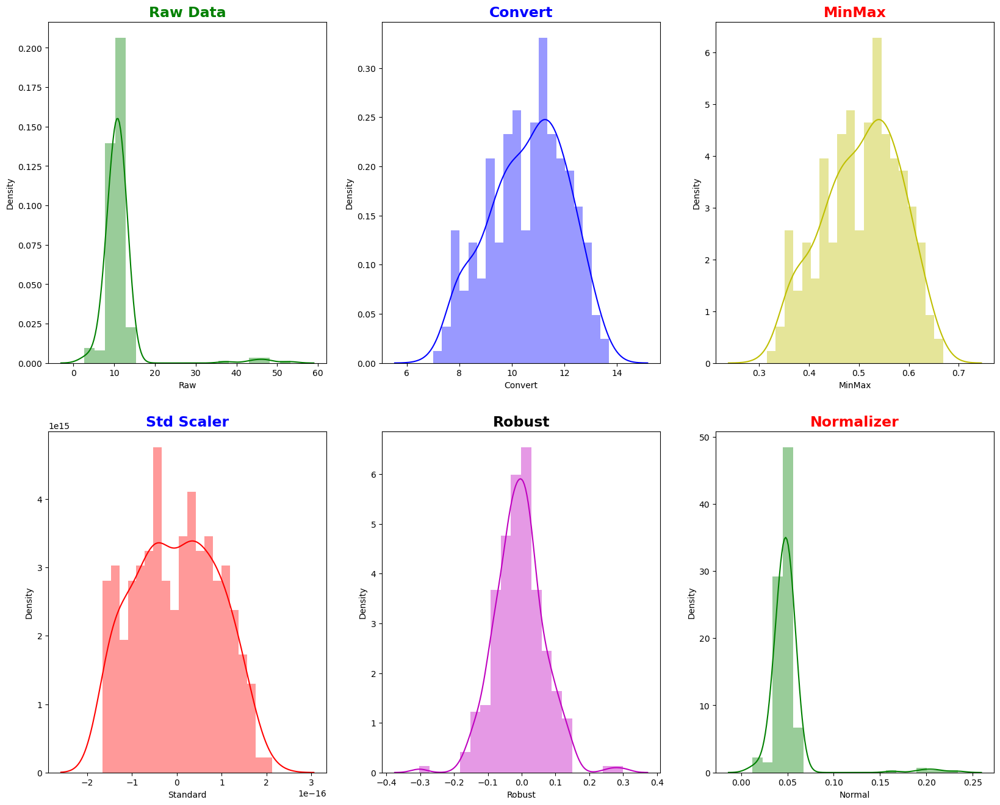

In [89]:
#Code Block 29

plt.figure(figsize=(20,16))

plt.subplot(231)
plt.title('Raw Data', fontweight='bold', color = 'green', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['Raw'], color="g", bins = 20)

plt.subplot(232)
plt.title('Convert', fontweight='bold', color = 'blue', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['Convert'], color="b", bins = 20)

plt.subplot(233)
plt.title('MinMax', fontweight='bold', color = 'red', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['MinMax'], color="y", bins = 20)

plt.subplot(234)
plt.title('Std Scaler', fontweight='bold', color = 'blue', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['Standard'], color="r", bins = 20)

plt.subplot(235)
plt.title('Robust', fontweight='bold', color = 'black', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['Robust'], color="m", bins = 20)

plt.subplot(236)
plt.title('Normalizer', fontweight='bold', color = 'red', fontsize='17', horizontalalignment='center')
sns.distplot(df_ap_brand_stats['Normal'], color="g", bins = 20)

In [90]:
#Code Block 30

df_ap_brand_stats.sort_values(by='Normal', ascending=True)

,index,Raw,Standard,MinMax,Convert,Robust,Normal
213,Ap002009_Advil_Cold_And_Sinus51238,2.697438,2.704190e-17,0.424360,9.062832,-0.302562,0.011914
218,Ap002038_Caplets51275,2.742680,-1.524487e-16,0.435670,9.277729,-0.128660,0.012202
217,Ap002037_Other_Cold_Sinus_And_Allergy_Remedies51274,3.261756,-8.906925e-17,0.565439,11.743343,0.087252,0.014663
215,Ap002028_Tylenol_Cold101264,4.197391,3.785866e-17,0.355266,7.750047,0.299348,0.018416
221,Ap002041_Liquigels_Liquicaps101278,5.015021,8.721012e-17,0.446113,9.476156,0.003755,0.022135
219,Ap002039_Effervescent101276,5.044433,1.311532e-16,0.449381,9.538247,0.261108,0.022341
99,Ap005655_Purchase_Malt_O_Meal_Ready_To_Eat_Cereal20_Ap005655,7.003378,-4.461913e-17,0.315967,7.003378,0.143340,0.031032
69,Ap005625_Purchase_Powerade_Ion_4_Non_Carbonated_Beverage20_Ap005625,7.633584,-1.128999e-16,0.349136,7.633584,0.079198,0.033709
1,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,7.709284,1.521107e-17,0.353120,7.709284,0.101326,0.033759
61,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,7.584727,5.712601e-17,0.346565,7.584727,0.073091,0.033819


In [92]:
#Code Block 31

df_ap_brand_stats.sort_values(by='Convert', ascending=True).head(10)

,index,Raw,Standard,MinMax,Convert,Robust,Normal
99,Ap005655_Purchase_Malt_O_Meal_Ready_To_Eat_Cereal20_Ap005655,7.003378,-4.461913e-17,0.315967,7.003378,0.143340,0.031032
61,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,7.584727,5.712601e-17,0.346565,7.584727,0.073091,0.033819
69,Ap005625_Purchase_Powerade_Ion_4_Non_Carbonated_Beverage20_Ap005625,7.633584,-1.128999e-16,0.349136,7.633584,0.079198,0.033709
28,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,7.670928,-1.943636e-17,0.351101,7.670928,0.095847,0.034136
1,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,7.709284,1.521107e-17,0.353120,7.709284,0.101326,0.033759
215,Ap002028_Tylenol_Cold101264,4.197391,3.785866e-17,0.355266,7.750047,0.299348,0.018416
52,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,7.813539,-3.718261e-17,0.358607,7.813539,0.090393,0.034952
82,Ap005638_Purchase_Cn_Crunch_Ready_To_Eat_Cereal20_Ap005638,7.883661,-7.402719e-17,0.362298,7.883661,0.110458,0.035060
77,Ap005633_Purchase_V8_Splash_Non_Carbonated_Beverage20_Ap005633,7.896208,1.036043e-16,0.362958,7.896208,0.112026,0.035120
34,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,7.902393,2.146451e-17,0.363284,7.902393,0.128913,0.035219


<Axes: xlabel='Standard', ylabel='index'>

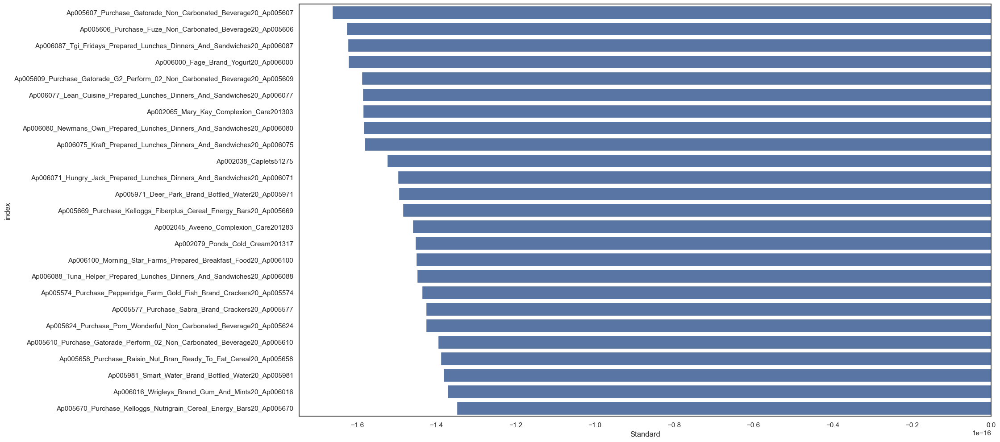

In [94]:
#Code Block 32

df_ap_brand_stats_25 = df_ap_brand_stats.sort_values(by='Standard', ascending=True).head(25)
sns.set(style='white')
plt.figure(figsize=(20,12))

sns.barplot(y = "index", x = "Standard", data = df_ap_brand_stats_25 )
#plt.gca().invert_xaxis()

<Axes: xlabel='MinMax', ylabel='index'>

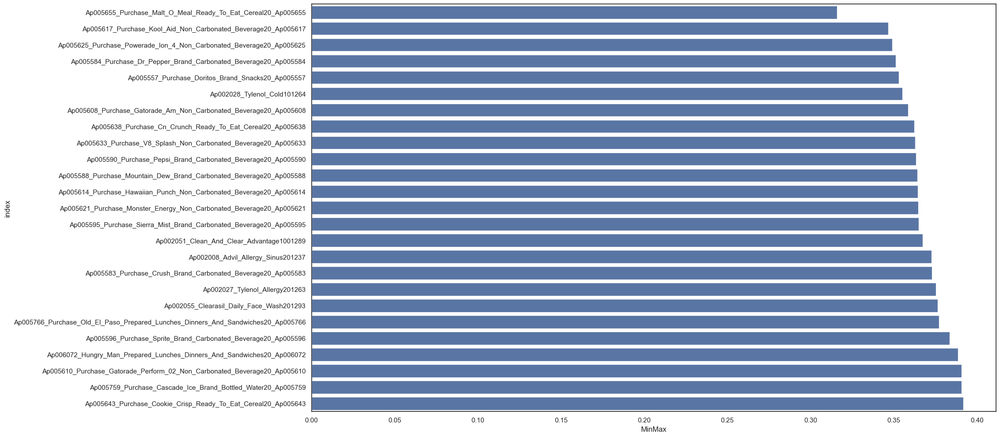

In [96]:
#Code Block 33

df_ap_brand_stats_25 = df_ap_brand_stats.sort_values(by='MinMax', ascending=True).head(25)
sns.set(style='white')
plt.figure(figsize=(20,12))
sns.barplot(y = "index", x = "MinMax", data = df_ap_brand_stats_25 )
#plt.gca().invert_xaxis()

<Axes: xlabel='Convert', ylabel='index'>

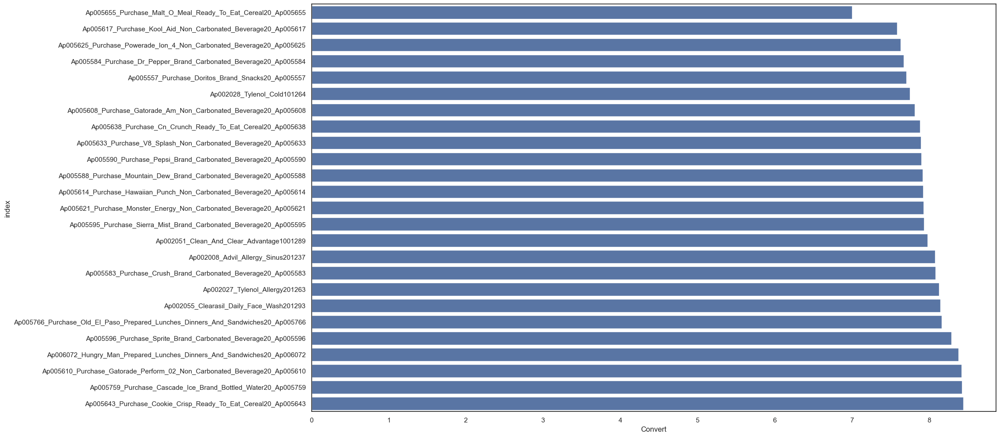

In [98]:
#Code Block 34

df_ap_brand_stats_25 = df_ap_brand_stats.sort_values(by='Convert', ascending=True).head(25)
sns.set(style='white')
plt.figure(figsize=(20,12))
sns.barplot(y = "index", x = "Convert", data = df_ap_brand_stats_25 )
#plt.gca().invert_xaxis()

In [101]:
#Code Block 35

df_ap_brand_demo.info(max_cols=270)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84082 entries, 0 to 84081
Data columns (total 256 columns):
 #    Column                                                                                           Non-Null Count  Dtype  
---   ------                                                                                           --------------  -----  
 0    APID                                                                                             84082 non-null  object 
 1    AP005556_Purchase_Cheetos_Brand_Snacks_rank_base_20_AP005556                                     84082 non-null  float64
 2    AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557                                     84082 non-null  float64
 3    AP005558_Purchase_Fritos_Brand_Snacks_rank_base_20_AP005558                                      84082 non-null  float64
 4    AP005559_Purchase_Jolly_Time_Brand_Snacks_rank_base_20_AP005559                                  84082 non-null  float64
 

### Look at top snack - Doritos

Text(0, 0.5, 'Doritos')

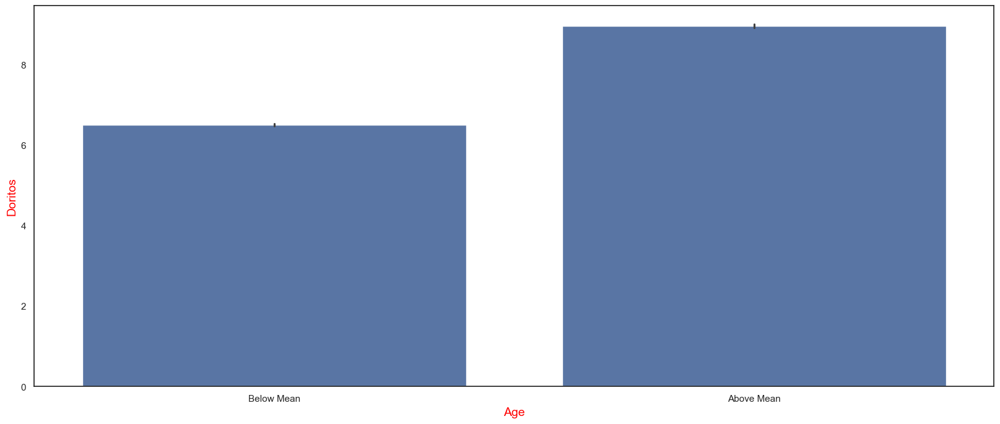

In [105]:
#Code Block 36


sns.set(style='white')
plt.figure(figsize=(20,8))
sns.barplot(y = "AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557", x = "Age_Cat", data = df_ap_brand_demo )
plt.xlabel('Age', color = 'red', fontsize='14')
plt.ylabel('Doritos', color = 'red', fontsize='14')


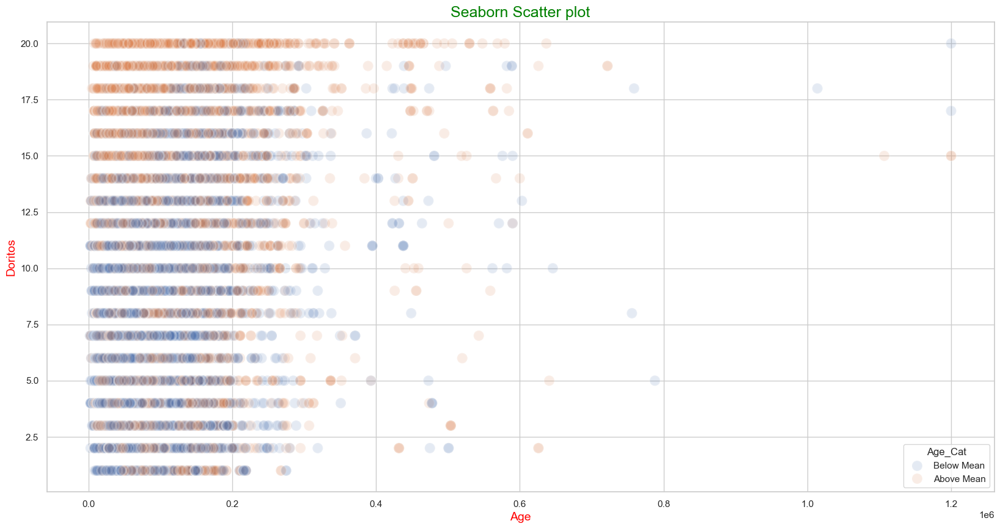

In [106]:
#Code Block 37

# Create a custom scatterplot
sns.set(style='whitegrid')
plt.figure(figsize=(20,10)) #changes area of scatterplot
sns.scatterplot(y='AP005557_Purchase_Doritos_Brand_Snacks_rank_base_20_AP005557', x='Income_Dollars', 
                data=df_ap_brand_demo, alpha=.15, s = 150, edgecolor='white', linewidth=2, hue='Age_Cat')
plt.title('Seaborn Scatter plot', color = 'green', fontsize='18')
plt.xlabel('Age', color = 'red', fontsize='14')
plt.ylabel('Doritos', color = 'red', fontsize='14')
plt.show()

<h2 style="color:blue;">  Creating a Correlation Matrix for a Recommender  </h2>

### Steps to create correlation matrix

- Transpose the dataset (items for recommendation need to be rows not columns).
- Reduce the number of items down using PCA
- Create a Correlation Matrix
- Filter the Correlation Matrix based on an itam that you would like recommendations
- Sort the filtered correlations (ascending = False)

In [112]:
#Code Block 38

df_ap_brand__mm_convert.head()

,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

### Transpose the data

- Must transpose the columns and rows because dimension reduction can only happen with columns

In [114]:
#Code Block 39

df_ap_brand_convert_T = df_ap_brand__mm_convert.T
df_ap_brand_convert_T.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,...,83832,83833,83834,83835,83836,83837,83838,83839,83840,83841,83842,83843,83844,83845,83846,83847,83848,83849,83850,83851,83852,83853,83854,83855,83856,83857,83858,83859,83860,83861,83862,83863,83864,83865,83866,83867,83868,83869,83870,83871,83872,83873,83874,83875,83876,83877,83878,83879,83880,83881,83882,83883,83884,83885,83886,83887,83888,83889,83890,83891,83892,83893,83894,83895,83896,83897,83898,83899,83900,83901,83902,83903,83904,83905,83906,83907,83908,83909,83910,83911,83912,83913,83914,83915,83916,83917,83918,83919,83920,83921,83922,83923,83924,83925,83926,83927,83928,83929,83930,83931,83932,83933,83934,83935,83936,83937,83938,83939,83940,83941,83942,83943,83944,83945,83946,83947,83948,83949,83950,83951,83952,83953,83954,83955,83956,83957,83958,83959,83960,83961,83962,83963,83964,83965,83966,83967,83968,83969,83970,83971,83972,83973,83974,83975,83976,83977,83978,83979,83980,83981,83982,83983,83984,83985,83986,83987,83988,83989,83990,83991,83992,83993,83994,83995,83996,83997,83998,83999,84000,84001,84002,84003,84004,84005,84006,84007,84008,84009,84010,84011,84012,84013,84014,84015,84016,84017,84018,84019,84020,84021,84022,84023,84024,84025,84026,84027,84028,84029,84030,84031,84032,84033,84034,84035,84036,84037,84038,84039,84040,84041,84042,84043,84044,84045,84046,84047,84048,84049,84050,84051,84052,84053,84054,84055,84056,84057,84058,84059,84060,84061,84062,84063,84064,84065,84066,84067,84068,84069,84070,84071,84072,84073,84074,84075,84076,84077,84078,84079,84080,84081
Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,8.0,8.0,13.0,13.0,10.0,13.0,13.0,1.0,4.0,12.0,17.0,14.0,5.0,5.0,18.0,1.0,16.0,14.0,13.0,1.0,10.0,18.0,9.0,8.0,8.0,4.0,5.0,4.0,10.0,15.0,12.0,14.0,6.0,1.0,10.0,16.0,13.0,16.0,2.0,7.0,10.0,13.0,14.0,13.0,17.0,3.0,5.0,14.0,12.0,7.0,15.0,3.0,4.0,13.0,18.0,4.0,2.0,2.0,14.0,12.0,5.0,9.0,14.0,11.0,14.0,10.0,3.0,9.0,6.0,9.0,13.0,1.0,11.0,3.0,6.0,13.0,11.0,8.0,5.0,14.0,11.0,4.0,9.0,17.0,10.0,11.0,13.0,10.0,4.0,10.0,15.0,18.0,16.0,8.0,13.0,10.0,12.0,13.0,8.0,11.0,10.0,13.0,12.0,18.0,15.0,13.0,11.0,15.0,15.0,7.0,8.0,17.0,4.0,13.0,2.0,19.0,15.0,19.0,11.0,5.0,10.0,13.0,3.0,1.0,17.0,6.0,11.0,15.0,9.0,17.0,17.0,3.0,9.0,13.0,12.0,6.0,12.0,12.0,14.0,9.0,4.0,7.0,4.0,8.0,17.0,11.0,9.0,10.0,13.0,18.0,11.0,4.0,14.0,19.0,4.0,15.0,4.0,5.0,4.0,17.0,7.0,11.0,12.0,8.0,15.0,8.0,13.0,12.0,20.0,5.0,12.0,13.0,3.0,11.0,6.0,16.0,2.0,18.0,17.0,12.0,18.0,11.0,11.0,9.0,10.0,14.0,11.0,16.0,3.0,14.0,11.0,12.0,2.0,15.0,3.0,2.0,16.0,3.0,5.0,11.0,18.0,8.0,14.0,9.0,9.0,19.0,12.0,16.0,18.0,10.0,14.0,10.0,3.0,7.0,10.0,7.0,7.0,13.0,4.0,9.0,8.0,1.0,10.0,6.0,16.0,4.0,6.0,5.0,8.0,9.0,12.0,15.0,7.0,15.0,13.0,8.0,10.0,10.0,11.0,6.0,6.0,7.0,6.0,13.0,4.0,8.0,3.0,11.0,7.0,9.0,...,13.0,9.0,12.0,5.0,11.0,9.0,14.0,5.0,3.0,19.0,15.0,3.0,10.0,16.0,6.0,10.0,12.0,4.0,11.0,12.0,11.0,19.0,16.0,9.0,18.0,15.0,9.0,17.0,17.0,14.0,17.0,5.0,13.0,5.0,9.0,8.0,4.0,9.0,10.0,16.0,2.0,1.0,19.0,9.0,12.0,17.0,14.0,9.0,9.0,13.0,11.0,16.0,2.0,7.0,8.0,12.0,1.0,7.0,17.0,5.0,8.0,16.0,3.0,2.0,20.0,9.0,11.0,7.0,5.0,10.0,20.0,14.0,15.0,14.0,14.0,2.0,9.0,4.0,5.0,8.0,18.0,5.0,13.0,10.0,7.0,1.0,5.0,13.0,5.0,9.0,10

In [115]:
df_ap_brand__mm_convert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84082 entries, 0 to 84081
Columns: 244 entries, Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556 to Ap002082_St_Ives_Apricot_Scrub201320
dtypes: float64(244)
memory usage: 156.5 MB


### Reduce the Dimensionailty using PCA with 150

- Why **150**?
    - You try to find a number that will represent the most variation.
    - First attempt should be a larger npcs, and then you can bring down for better efficiency

In [118]:
#Code Block 40

from sklearn.decomposition import PCA
# Set number of principal components for model
n_pcs = 150
model = PCA(n_components=n_pcs)

# Fit the model - return projected data
df_pca = model.fit_transform(df_ap_brand_convert_T)

#Create a DataFrame of the projected data
df_pca = pd.DataFrame(df_pca)
df_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149
0,769.188712,-642.684737,-287.989861,140.467931,348.061704,230.381821,-54.339291,-64.024273,-181.683399,85.497312,120.657283,168.310272,22.578056,-94.133001,-142.695976,12.455741,-37.757982,156.530953,2.785492,-27.814460,-107.319167,32.848865,-21.411223,11.403712,71.112554,101.858619,-30.544935,-21.287578,13.683837,3.710602,-22.030545,19.010561,7.365156,-20.771655,93.623410,54.617161,-23.430139,-60.086731,-5.312104,-90.092624,-16.506306,69.566304,-23.028837,0.391353,19.537486,71.472707,84.256470,45.010303,60.736981,-2.285782,60.690637,8.207949,-125.470449,72.857107,16.599276,-65.121449,-7.910554,-42.004809,-81.461759,-37.423844,-71.706812,-1.056388,-36.059918,-8.485086,29.687420,30.289786,-9.168840,38.783435,-40.930693,36.525640,-71.080132,4.522379,-30.516404,8.556623,-7.102334,49.068317,12.665840,31.804062,-13.748816,-91.725049,-18.816298,36.069356,30.938735,8.938744,20.638458,-53.421383,-35.131349,73.748044,-21.325850,-21.083184,-22.008722,11.628612,8.258750,60.525196,11.839939,-22.266973,-50.527675,56.353245,45.094007,26.941016,41.877510,30.452042,-74.619559,2.192892,5.227237,-91.586454,85.539615,-5.488670,-21.370929,-52.034073,8.421578,-41.331934,47.998482,74.309248,-7.741233,-19.997168,39.838677,11.939648,-129.598316,35.618671,-30.937457,63.882722,-47.893168,-27.802968,83.771999,-73.384805,61.210260,-41.383312,99.063398,51.531732,1.241842,-183.618343,61.624201,55.345426,31.405892,5.787163,178.937530,-24.741410,-89.386193,-47.413912,-35.778064,-2.665637,-97.622054,-35.059023,70.586197,75.524275,-111.931722,65.887904,-26.707580,-87.083728
1,1032.876023,-221.554625,846.745882,-152.593555,-67.306272,-62.602576,-49.512652,-106.823606,-27.368835,38.930505,-107.608994,30.120788,-131.937580,-58.367989,-42.638018,-49.667494,-83.660158,126.231466,-16.570719,14.068353,-60.061534,-30.322435,-78.663606,-57.631321,-18.853307,7.817489,36.900502,29.382602,-22.759592,58.568511,2.964961,11.760362,-50.496312,8.972221,-25.635785,12.610304,-58.400803,-63.903009,31.796793,-52.925457,-12.284104,-30.383157,86.301017,10.829144,36.371544,12.900788,-31.516360,-23.188108,-15.408856,72.525340,1.043739,50.595377,-53.758281,30.847887,-42.315875,38.490363,-7.983880,-61.750201,0.939931,-8.916824,-15.601210,16.627926,18.057266,-17.745374,-27.195670,88.496873,-2.057082,18.813576,-7.933233,52.494765,30.795586,-31.150210,-48.231807,26.697893,21.589441,-39.949777,-13.892100,7.994732,19.874080,-50.168038,-50.319005,36.832087,21.595389,20.003047,-12.534747,16.093748,1.591817,-4.279553,64.788777,6.578577,-45.477055,9.710068,26.075790,32.364256,-64.502946,-58.931576,-16.758369,-31.463624,-1.036658,-50.844490,3.088499,-33.397160,10.419834,19.808767,14.195213,-0.126225,-7.527310,-6.449771,-80.627845,-15.831091,-4.190250,36.592237,-31.727328,-65.424453,19.479132,-51.314092,40.760212,14.773911,-2.768017,26.595969,55.063310,-53.355348,27.247456,-15.051061,4.911295,36.676866,-43.133848,-82.539644,52.637154,-85.951083,6.858979,14.737748,-49.914960,-14.808448,1.185489,42.082739,34.625556,-22.823992,-35.776247,-26.742267,-2.664865,-26.102752,-64.015267,-69.715074,-19.221327,7.673232,30.396867,-16.737022,-83.662834,-44.426506
2,-267.379559,-956.744850,-193.584309,256.268404,-179.361710,256.562593,-3.595415,12.708895,-3.679692,44.323063,-23.489207,-9.629201,-181.210933,58.412044,-11.225916,73.246243,12.217056,-20.766992,76.239078,-2.624890,5.192251,27.143312,-35.959038,28.679460,-27.478763,-38.727685,53.699770,55.161987,28.124600,-63.895125,28.293332,82.505976,-66.311067,-0.583517,29.270691,-

In [119]:
#Code Block 41

names = []
for x in range(n_pcs):
    names.append('PC%d'%(x+1))

df_pca.columns = names
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150
0,769.188712,-642.684737,-287.989861,140.467931,348.061704,230.381821,-54.339291,-64.024273,-181.683399,85.497312,120.657283,168.310272,22.578056,-94.133001,-142.695976,12.455741,-37.757982,156.530953,2.785492,-27.814460,-107.319167,32.848865,-21.411223,11.403712,71.112554,101.858619,-30.544935,-21.287578,13.683837,3.710602,-22.030545,19.010561,7.365156,-20.771655,93.623410,54.617161,-23.430139,-60.086731,-5.312104,-90.092624,-16.506306,69.566304,-23.028837,0.391353,19.537486,71.472707,84.256470,45.010303,60.736981,-2.285782,60.690637,8.207949,-125.470449,72.857107,16.599276,-65.121449,-7.910554,-42.004809,-81.461759,-37.423844,-71.706812,-1.056388,-36.059918,-8.485086,29.687420,30.289786,-9.168840,38.783435,-40.930693,36.525640,-71.080132,4.522379,-30.516404,8.556623,-7.102334,49.068317,12.665840,31.804062,-13.748816,-91.725049,-18.816298,36.069356,30.938735,8.938744,20.638458,-53.421383,-35.131349,73.748044,-21.325850,-21.083184,-22.008722,11.628612,8.258750,60.525196,11.839939,-22.266973,-50.527675,56.353245,45.094007,26.941016,41.877510,30.452042,-74.619559,2.192892,5.227237,-91.586454,85.539615,-5.488670,-21.370929,-52.034073,8.421578,-41.331934,47.998482,74.309248,-7.741233,-19.997168,39.838677,11.939648,-129.598316,35.618671,-30.937457,63.882722,-47.893168,-27.802968,83.771999,-73.384805,61.210260,-41.383312,99.063398,51.531732,1.241842,-183.618343,61.624201,55.345426,31.405892,5.787163,178.937530,-24.741410,-89.386193,-47.413912,-35.778064,-2.665637,-97.622054,-35.059023,70.586197,75.524275,-111.931722,65.887904,-26.707580,-87.083728
1,1032.876023,-221.554625,846.745882,-152.593555,-67.306272,-62.602576,-49.512652,-106.823606,-27.368835,38.930505,-107.608994,30.120788,-131.937580,-58.367989,-42.638018,-49.667494,-83.660158,126.231466,-16.570719,14.068353,-60.061534,-30.322435,-78.663606,-57.631321,-18.853307,7.817489,36.900502,29.382602,-22.759592,58.568511,2.964961,11.760362,-50.496312,8.972221,-25.635785,12.610304,-58.400803,-63.903009,31.796793,-52.925457,-12.284104,-30.383157,86.301017,10.829144,36.371544,12.900788,-31.516360,-23.188108,-15.408856,72.525340,1.043739,50.595377,-53.758281,30.847887,-42.315875,38.490363,-7.983880,-61.750201,0.939931,-8.916824,-15.601210,16.627926,18.057266,-17.745374,-27.195670,88.496873,-2.057082,18.813576,-7.933233,52.494765,30.795586,-31.150210,-48.231807,26.697893,21.589441,-39.949777,-13.892100,7.994732,19.874080,-50.168038,-50.319005,36.832087,21.595389,20.003047,-12.534747,16.093748,1.591817,-4.279553,64.788777,6.578577,-45.477055,9.710068,26.075790,32.364256,-64.502946,-58.931576,-16.758369,-31.463624,-1.036658,-50.844490,3.088499,-33.397160,10.419834,19.808767,14.195213,-0.126225,-7.527310,-6.449771,-80.627845,-15.831091,-4.190250,36.592237,-31.727328,-65.424453,19.479132,-51.314092,40.760212,14.773911,-2.768017,26.595969,55.063310,-53.355348,27.247456,-15.051061,4.911295,36.676866,-43.133848,-82.539644,52.637154,-85.951083,6.858979,14.737748,-49.914960,-14.808448,1.185489,42.082739,34.625556,-22.823992,-35.776247,-26.742267,-2.664865,-26.102752,-64.015267,-69.715074,-19.221327,7.673232,30.396867,-16.737022,-83.662834,-44.426506
2,-267.379559,-956.744850,-193.584309,256.268404,-179.361710,256.56259

In [120]:
#Code Block 42

explained_ratio = model.explained_variance_ratio_
explained_ratio = pd.DataFrame(explained_ratio)
explained_ratio = explained_ratio.rename(columns = {0: 'explained_ratio'})
explained_ratio['explained_ratio_sum']= np.cumsum(explained_ratio.explained_ratio)
explained_ratio

,explained_ratio,explained_ratio_sum
0,0.223173,0.223173
1,0.091534,0.314707
2,0.044674,0.359382
3,0.042414,0.401796
4,0.031515,0.433311
5,0.021190,0.454501
6,0.017222,0.471724
7,0.014282,0.486006
8,0.009857,0.495862
9,0.009808,0.505670


### Create a Correlation Matrix

In [122]:
#Code Block 43

df_pca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Columns: 150 entries, PC1 to PC150
dtypes: float64(150)
memory usage: 286.1 KB


In [123]:
#Code Block 44

corr_mat = np.corrcoef(df_pca)
corr_mat.shape

(244, 244)

In [124]:
#Code Block 45

corr_mat

array([[ 1.        ,  0.35467224,  0.31926587, ...,  0.13515434,
         0.02091405, -0.28193523],
       [ 0.35467224,  1.        , -0.14789527, ..., -0.07077744,
         0.11826939,  0.15191367],
       [ 0.31926587, -0.14789527,  1.        , ..., -0.17379586,
        -0.35586563, -0.51011518],
       ...,
       [ 0.13515434, -0.07077744, -0.17379586, ...,  1.        ,
         0.24948849,  0.27565156],
       [ 0.02091405,  0.11826939, -0.35586563, ...,  0.24948849,
         1.        ,  0.33270562],
       [-0.28193523,  0.15191367, -0.51011518, ...,  0.27565156,
         0.33270562,  1.        ]])

In [126]:
#Code Block 46

corr_mat = pd.DataFrame(corr_mat, columns=(df_ap_cols))
corr_mat.index = df_ap_cols
corr_mat

,Ap005556_Purchase_Cheetos_Brand_Snacks20_Ap005556,Ap005557_Purchase_Doritos_Brand_Snacks20_Ap005557,Ap005558_Purchase_Fritos_Brand_Snacks20_Ap005558,Ap005559_Purchase_Jolly_Time_Brand_Snacks20_Ap005559,Ap005560_Purchase_Lays_Brand_Snacks20_Ap005560,Ap005561_Purchase_Orville_Redenbachers_Brand_Snacks20_Ap005561,Ap005562_Purchase_Pop_Secret_Brand_Snacks20_Ap005562,Ap005563_Purchase_Pringles_Brand_Snacks20_Ap005563,Ap005564_Purchase_Rold_Gold_Brand_Snacks20_Ap005564,Ap005565_Purchase_Ruffles_Brand_Snacks20_Ap005565,Ap005566_Purchase_Stacys_Brand_Snacks20_Ap005566,Ap005567_Purchase_Tostitos_Brand_Snacks20_Ap005567,Ap005568_Purchase_Cheese_Nips_Brand_Crackers20_Ap005568,Ap005569_Purchase_Honeymaid_Brand_Crackers20_Ap005569,Ap005570_Purchase_Kashi_Brand_Crackers20_Ap005570,Ap005571_Purchase_Keebler_Brand_Crackers20_Ap005571,Ap005572_Purchase_Lunchables_Brand_Crackers20_Ap005572,Ap005573_Purchase_Nabisco_Brand_Crackers20_Ap005573,Ap005574_Purchase_Pepperidge_Farm_Gold_Fish_Brand_Crackers20_Ap005574,Ap005575_Purchase_Ritz_Brand_Crackers20_Ap005575,Ap005576_Purchase_Rykrisp_Brand_Crackers20_Ap005576,Ap005577_Purchase_Sabra_Brand_Crackers20_Ap005577,Ap005578_Purchase_Sunshine_Brand_Crackers20_Ap005578,Ap005579_Purchase_Teddy_Grahams_Brand_Crackers20_Ap005579,Ap005580_Purchase_Triscuit_Brand_Crackers20_Ap005580,Ap005581_Purchase_Wheat_Thins_Brand_Crackers20_Ap005581,Ap005582_Purchase_Aw_Brand_Carbonated_Beverage20_Ap005582,Ap005583_Purchase_Crush_Brand_Carbonated_Beverage20_Ap005583,Ap005584_Purchase_Dr_Pepper_Brand_Carbonated_Beverage20_Ap005584,Ap005585_Purchase_Fanta_Brand_Carbonated_Beverage20_Ap005585,Ap005586_Purchase_Fresca_Brand_Carbonated_Beverage20_Ap005586,Ap005587_Purchase_Goose_Island_Brand_Carbonated_Beverage20_Ap005587,Ap005588_Purchase_Mountain_Dew_Brand_Carbonated_Beverage20_Ap005588,Ap005589_Purchase_Ocean_Spray_Brand_Carbonated_Beverage20_Ap005589,Ap005590_Purchase_Pepsi_Brand_Carbonated_Beverage20_Ap005590,Ap005591_Purchase_Diet_Pepsi_Brand_Carbonated_Beverage20_Ap005591,Ap005592_Purchase_Pepsi_Max_Brand_Carbonated_Beverage20_Ap005592,Ap005593_Purchase_Schweppes_Brand_Carbonated_Beverage20_Ap005593,Ap005594_Purchase_Seven_Up_Brand_Carbonated_Beverage20_Ap005594,Ap005595_Purchase_Sierra_Mist_Brand_Carbonated_Beverage20_Ap005595,Ap005596_Purchase_Sprite_Brand_Carbonated_Beverage20_Ap005596,Ap005597_Purchase_Arizona_Non_Carbonated_Beverage20_Ap005597,Ap005598_Purchase_Brisk_Non_Carbonated_Beverage20_Ap005598,Ap005599_Purchase_Campbells_Non_Carbonated_Beverage20_Ap005599,Ap005600_Purchase_Capri_Sun_Non_Carbonated_Beverage20_Ap005600,Ap005601_Purchase_Country_Time_Non_Carbonated_Beverage20_Ap005601,Ap005602_Purchase_Crystal_Light_Non_Carbonated_Beverage20_Ap005602,Ap005603_Purchase_Dasani_Non_Carbonated_Beverage20_Ap005603,Ap005604_Purchase_Dole_Non_Carbonated_Beverage20_Ap005604,Ap005605_Purchase_Floridas_Natural_Non_Carbonated_Beverage20_Ap005605,Ap005606_Purchase_Fuze_Non_Carbonated_Beverage20_Ap005606,Ap005607_Purchase_Gatorade_Non_Carbonated_Beverage20_Ap005607,Ap005608_Purchase_Gatorade_Am_Non_Carbonated_Beverage20_Ap005608,Ap005609_Purchase_Gatorade_G2_Perform_02_Non_Carbonated_Beverage20_Ap005609,Ap005610_Purchase_Gatorade_Perform_02_Non_Carbonated_Beverage20_Ap005610,Ap005611_Purchase_Gatorade_Rain_Non_Carbonated_Beverage20_Ap005611,Ap005612_Purchase_Gatorade_Recover_03_Non_Carbonated_Beverage20_Ap005612,Ap005613_Purchase_Gatorade_Extreme_Non_Carbonated_Beverage20_Ap005613,Ap005614_Purchase_Hawaiian_Punch_Non_Carbonated_Beverage20_Ap005614,Ap005615_Purchase_Hawaiis_Own_Non_Carbonated_Beverage20_Ap005615,Ap005616_Purchase_Juicy_Juice_Non_Carbonated_Beverage20_Ap005616,Ap005617_Purchase_Kool_Aid_Non_Carbonated_Beverage20_Ap005617,Ap005618_Purchase_Lipton_Non_Carbonated_Beverage20_Ap005618,Ap005619_Purchase_Minute_Maid_Non_Carbonated_Beverage20_Ap005619,Ap005620_Purchase_Mio_Non_Carbonated_Beverage20_Ap005620,Ap005621_Purchase_Monster_Energy_Non_Carbonated_Beverage20_Ap005621,Ap005622_Purchase_Ocean_Spray_Non_Carbon

### Filter Correlation Matrix to show item for Recommender

In [129]:
#Code Block 47

corr_Doritos = pd.DataFrame(corr_mat['Doritos_Brand_Snacks'])
corr_Doritos.shape

KeyError: 'Doritos_Brand_Snacks'

In [ ]:
#Code Block 48

corr_Doritos.head()

In [ ]:
#Code Block 49

corr_Doritos.sort_values(ascending=False, by='Doritos_Brand_Snacks').head()

In [ ]:
#Code Block 50

corr_Doritos = corr_Doritos[corr_Doritos['Doritos_Brand_Snacks']<.9999]
corr_Doritos = corr_Doritos.sort_values(ascending=False, by='Doritos_Brand_Snacks').head(20)
corr_Doritos

<h2 style="color:blue;">  Analyze other Products and Brands for Recommendations  </h2>

In [ ]:
#Code Block 51

corr_Doritos

In [ ]:
#Code Block 52

corr_Doritos_150 = corr_Doritos.reset_index()
corr_Doritos_150 = corr_Doritos_150.rename(columns={corr_Doritos_150.columns[0]: 'Doritos_150_prod', corr_Doritos_150.columns[1]: 'Doritos_150_corr'})
corr_Doritos_150


### PCA with 20 Components

In [ ]:
#Code Block 53

n_pcs = 20
model = PCA(n_components=n_pcs)

# Fit the model - return projected data
df_pca_20 = model.fit_transform(df_ap_brand_convert_T)

#Create a DataFrame of the projected data
df_pca_20 = pd.DataFrame(df_pca_20)
df_pca_20.head()


In [ ]:
#Code Block 54

#Add a variable name so that it is easy to change
varRec = 'Doritos_Brand_Snacks'
varTitle = 'Doritos_20'

corr_mat_20 = np.corrcoef(df_pca_20)
corr_mat_20 = pd.DataFrame(corr_mat_20, columns=(df_ap_cols))
corr_mat_20.index = df_ap_cols

df_corr_mat_20 = pd.DataFrame(corr_mat_20[varRec]).sort_values(ascending=False, by=varRec)

df_corr_mat_20 = df_corr_mat_20[df_corr_mat_20[varRec]<.999].head(20)



df_corr_mat_20 = df_corr_mat_20.reset_index()
df_corr_mat_20 = df_corr_mat_20.rename(columns={df_corr_mat_20.columns[0]: varTitle + '_prod', df_corr_mat_20.columns[1]: varTitle + '_corr'})
df_corr_mat_20


In [ ]:
#Code Block 55

corr_Doritos_20 = df_corr_mat_20
corr_Doritos_all = pd.concat([corr_Doritos_150, corr_Doritos_20], axis=1)
corr_Doritos_all

### Recommender for Fritos

In [ ]:
#Code Block 56

varRec = 'Fritos_Brand_Snacks'
varTitle = 'Fritos_20'

corr_mat_20 = np.corrcoef(df_pca_20)
corr_mat_20 = pd.DataFrame(corr_mat_20, columns=(df_ap_cols))
corr_mat_20.index = df_ap_cols

df_corr_mat_20 = pd.DataFrame(corr_mat_20[varRec]).sort_values(ascending=False, by=varRec)

df_corr_mat_20 = df_corr_mat_20[df_corr_mat_20[varRec]<.999].head(20)



df_corr_mat_20 = df_corr_mat_20.reset_index()
df_corr_mat_20 = df_corr_mat_20.rename(columns={df_corr_mat_20.columns[0]: varTitle + '_prod', df_corr_mat_20.columns[1]: varTitle + '_corr'})
df_corr_mat_20

In [ ]:
#Code Block 57

corr_Fritos_20 = df_corr_mat_20

### Create Recommender for Cheetos

In [ ]:
#Code Block 58

varRec = 'Cheetos_Brand_Snacks'
varTitle = 'Cheetos_20'

corr_mat_20 = np.corrcoef(df_pca_20)
corr_mat_20 = pd.DataFrame(corr_mat_20, columns=(df_ap_cols))
corr_mat_20.index = df_ap_cols

df_corr_mat_20 = pd.DataFrame(corr_mat_20[varRec]).sort_values(ascending=False, by=varRec)

df_corr_mat_20 = df_corr_mat_20[df_corr_mat_20[varRec]<.999].head(20)



df_corr_mat_20 = df_corr_mat_20.reset_index()
df_corr_mat_20 = df_corr_mat_20.rename(columns={df_corr_mat_20.columns[0]: varTitle + '_prod', df_corr_mat_20.columns[1]: varTitle + '_corr'})
df_corr_mat_20

In [ ]:
#Code Block 59

corr_Cheetos_20 = df_corr_mat_20

### Create Recommender for Lays 

In [133]:
#Code Block 60

varRec = 'Lays_Brand_Snacks'
varTitle = 'Lays_20'

corr_mat_20 = np.corrcoef(df_pca_20)
corr_mat_20 = pd.DataFrame(corr_mat_20, columns=(df_ap_cols))
corr_mat_20.index = df_ap_cols

df_corr_mat_20 = pd.DataFrame(corr_mat_20[varRec]).sort_values(ascending=False, by=varRec)

df_corr_mat_20 = df_corr_mat_20[df_corr_mat_20[varRec]<.999].head(20)



df_corr_mat_20 = df_corr_mat_20.reset_index()
df_corr_mat_20 = df_corr_mat_20.rename(columns={df_corr_mat_20.columns[0]: varTitle + '_prod', df_corr_mat_20.columns[1]: varTitle + '_corr'})
df_corr_mat_20

NameError: name 'df_pca_20' is not defined

In [ ]:
#Code Block 61

corr_Lays_20 = df_corr_mat_20

In [ ]:
#Code Block 62

df_snacks = pd.concat([corr_Doritos_all, corr_Fritos_20, corr_Cheetos_20, corr_Lays_20], axis=1)
df_snacks

In [145]:
#Code Block 63

df_snacks = df_snacks.reset_index()
df_snacks

NameError: name 'df_snacks' is not defined

In [147]:
#Code Block 64

df_snacks_melt =pd.melt(df_snacks, id_vars=['index'], value_vars=['Doritos_20_prod', 'Fritos_20_prod', 'Cheetos_20_prod', 'Lays_20_prod'])
df_snacks_melt

NameError: name 'df_snacks' is not defined

In [149]:
#Code Block 65

df_snacks_melt.groupby('value').count().sort_values(by='variable', ascending=False)

NameError: name 'df_snacks_melt' is not defined

### Summary from looking at snacks

- Fritos, Cheetos, and Doritos are part of Pepsico
- Pepsico also owns Pepsi, Mountain Dew, Sierra Mist, Gatorade, Lipton and a few other brands
- https://www.pepsico.com/brands/product-information

#### Conclusion:
- Those that buy Pepsico snacks also are likely to purchase Pepsico beverages - good opportunity for cross promotion